# Real Choropleths from Zip Codes with GeoTable

In the second part of the workshop, we will cover how to process data to generate the choropleths, including file formats, spatial reference systems, table joins and color stops.

We will use the following datasets, courtesy of [NYC Open Data](https://data.cityofnewyork.us).

- [NYC Zip Code Boundaries](https://data.cityofnewyork.us/Business/Zip-Code-Boundaries/i8iw-xf4u)
- [NYC Building Footprints](https://data.cityofnewyork.us/Housing-Development/Building-Footprints/nqwf-w8eh)

For more 2D spatial data, please see [NYC DoITT 2D Data](https://www1.nyc.gov/site/doitt/residents/gis-2d-data.page).

In [ ]:
pip install geotable --upgrade

## File Formats

Standard file formats for geospatial data include geojson, shapefile, kml and kmz.

In [2]:
import geotable

# Load NYC zip codes via URL using geotable
t = geotable.load('https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip')
len(t)

263

In [3]:
t[:2]

,ZIPCODE,BLDGZIP,PO_NAME,POPULATION,AREA,STATE,COUNTY,ST_FIPS,CTY_FIPS,URL,SHAPE_AREA,SHAPE_LEN,geometry_object,geometry_layer,geometry_proj4
0,11436,0,Jamaica,18681.0,2.269930e+07,NY,Queens,36,081,http://www.usps.com/,0.0,0.0,"POLYGON ((1038098.251871482 188138.3800067157,...",ZIP_CODE_040114,+proj=lcc +lat_0=40.1666666666667 +lon_0=-74 +...
1,11213,0,Brooklyn,62426.0,2.963100e+07,NY,Kings,36,047,http://www.usps.com/,0.0,0.0,"POLYGON ((1001613.712964058 186926.4395172149,...",ZIP_CODE_040114,+proj=lcc +lat_0=40.1666666666667 +lon_0=-74 +...


In [4]:
t.draw()

In [16]:
t['POPULATION'].describe()

count       263.000000
mean      31933.863118
std       29907.574253
min           0.000000
25%          49.500000
50%       27985.000000
75%       54445.000000
max      109069.000000
Name: POPULATION, dtype: float64

In [8]:
t.save_geojson('nyc-zip-codes.geojson', target_proj4=geotable.LONGITUDE_LATITUDE_PROJ4)

'nyc-zip-codes.geojson'

In [17]:
from geotable import ColorfulGeometryCollection
ColorfulGeometryCollection(t.geometries)

In [18]:
from shapely.geometry import GeometryCollection
GeometryCollection(t.geometries).centroid.coords[0]

(1003286.930855929, 192405.10461819806)

In [11]:
import json
d = json.load(open('nyc-zip-codes.geojson', 'rt'))

In [12]:
d.keys()

dict_keys(['type', 'name', 'features'])

In [15]:
d['features'][0]['properties']

{'ZIPCODE': '11436',
 'BLDGZIP': '0',
 'PO_NAME': 'Jamaica',
 'POPULATION': 18681.0,
 'AREA': 22699295.4594145,
 'STATE': 'NY',
 'COUNTY': 'Queens',
 'ST_FIPS': '36',
 'CTY_FIPS': '081',
 'URL': 'http://www.usps.com/',
 'SHAPE_AREA': 0.0,
 'SHAPE_LEN': 0.0}

In [ ]:
# Load geojson from shapely geometries

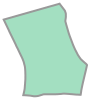

In [20]:
# Load shapely geometries from geojson
from shapely.geometry import shape
shape(d['features'][0]['geometry'])

In [22]:
from shapely.geometry import GeometryCollection
collection = GeometryCollection([shape(_['geometry']) for _ in d['features']])
collection.centroid.coords[0]

(-73.93113800247127, 40.694823501983805)

In [23]:
center_coordinates = collection.centroid.coords[0]
center_coordinates

(-73.93113800247127, 40.694823501983805)

In [ ]:
# Get geojson
# Render geojson

In [13]:
from mapboxgl.utils import create_color_stops, create_numeric_stops
from mapboxgl.viz import ChoroplethViz
from os import getenv

MAPBOX_TOKEN = getenv('MAPBOX_TOKEN', 'YOUR-MAPBOX-TOKEN')

In [28]:
v = ChoroplethViz(
    d,
    style='mapbox://styles/mapbox/dark-v10',    
    access_token=MAPBOX_TOKEN,
    color_property='POPULATION',
    color_stops=create_color_stops([0, 49.5, 27985, 54445, 109069], colors='Greens'),
    color_function_type='interpolate',
    line_stroke='--',
    line_color='Yellow',
    line_width=1,
    line_opacity=0.9,
    opacity=0.8,
    center=center_coordinates,
    zoom=9,
    below_layer='waterway-label',
    legend_layout='horizontal',
    legend_key_shape='bar',
    legend_key_borders_on=False)
v.show()

In [ ]:
t[:3]

In [ ]:
# load nyc zip
# load nyc buildings
# load geojson
# load shapefile
# load kml
# load kmz
# transform shapefile -> geojson
# transform kml -> geojson
# transform kmz -> geojson

In [ ]:
geojson
shapefile
kml
how to transform between

load zip code
load bbl buildings

## Spatial Reference Systems

In [46]:
t = geotable.load('nyc-zip-codes.geojson')

In [47]:
t.geometry_proj4[0]

'+proj=longlat +datum=WGS84 +no_defs'

In [48]:
t[:2]

,ZIPCODE,BLDGZIP,PO_NAME,POPULATION,AREA,STATE,COUNTY,ST_FIPS,CTY_FIPS,URL,SHAPE_AREA,SHAPE_LEN,geometry_object,geometry_layer,geometry_proj4
0,11436,0,Jamaica,18681.0,2.269930e+07,NY,Queens,36,081,http://www.usps.com/,0.0,0.0,POLYGON ((-73.80584869826042 40.68290860217611...,ZIP_CODE_040114,+proj=longlat +datum=WGS84 +no_defs
1,11213,0,Brooklyn,62426.0,2.963100e+07,NY,Kings,36,047,http://www.usps.com/,0.0,0.0,POLYGON ((-73.93739762969345 40.67972907566245...,ZIP_CODE_040114,+proj=longlat +datum=WGS84 +no_defs


In [32]:
t = geotable.load('nyc-zip-codes.geojson', target_proj4=geotable.SPHERICAL_MERCATOR_PROJ4)
t.geometry_proj4[0]

'+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lon_0=0 +x_0=0 +y_0=0 +k=1 +units=m +nadgrids=@null +wktext +no_defs'

In [33]:
t[:2]

,ZIPCODE,BLDGZIP,PO_NAME,POPULATION,AREA,STATE,COUNTY,ST_FIPS,CTY_FIPS,URL,SHAPE_AREA,SHAPE_LEN,geometry_object,geometry_layer,geometry_proj4
0,11436,0,Jamaica,18681.0,2.269930e+07,NY,Queens,36,081,http://www.usps.com/,0.0,0.0,"POLYGON ((-8216029.494655743 4965682.66290267,...",ZIP_CODE_040114,+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lo...
1,11213,0,Brooklyn,62426.0,2.963100e+07,NY,Kings,36,047,http://www.usps.com/,0.0,0.0,POLYGON ((-8230673.454717266 4965215.932877949...,ZIP_CODE_040114,+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lo...


In [ ]:
t = geotable.load('https://data.cityofnewyork.us/download/i8iw-xf4u/application%2Fzip')

In [ ]:
# Load into longitude latitude spatial reference

In [ ]:
t['geometry_proj4'][0]

how to transform between

In [ ]:
how to id which srs
# compare geopy geocode with actual
# get distance and rank
# https://spatialreference.org

## Table Joins

In [ ]:
how to join

In [38]:
import pandas as pd

In [43]:
url = 'https://data.cityofnewyork.us/api/views/kku6-nxdu/rows.csv'
statistics_table = pd.read_csv(url, dtype=str)

In [44]:
len(statistics_table)

236

In [45]:
statistics_table.iloc[0]

JURISDICTION NAME                      10001
COUNT PARTICIPANTS                        44
COUNT FEMALE                              22
PERCENT FEMALE                           0.5
COUNT MALE                                22
PERCENT MALE                             0.5
COUNT GENDER UNKNOWN                       0
PERCENT GENDER UNKNOWN                     0
COUNT GENDER TOTAL                        44
PERCENT GENDER TOTAL                     100
COUNT PACIFIC ISLANDER                     0
PERCENT PACIFIC ISLANDER                   0
COUNT HISPANIC LATINO                     16
PERCENT HISPANIC LATINO                 0.36
COUNT AMERICAN INDIAN                      0
PERCENT AMERICAN INDIAN                    0
COUNT ASIAN NON HISPANIC                   3
PERCENT ASIAN NON HISPANIC              0.07
COUNT WHITE NON HISPANIC                   1
PERCENT WHITE NON HISPANIC              0.02
COUNT BLACK NON HISPANIC                  21
PERCENT BLACK NON HISPANIC              0.48
COUNT OTHE

In [51]:
t.iloc[0]

ZIPCODE                                                        11436
BLDGZIP                                                            0
PO_NAME                                                      Jamaica
POPULATION                                                   18681.0
AREA                                                 22699295.459415
STATE                                                             NY
COUNTY                                                        Queens
ST_FIPS                                                           36
CTY_FIPS                                                         081
URL                                             http://www.usps.com/
SHAPE_AREA                                                       0.0
SHAPE_LEN                                                        0.0
geometry_object    POLYGON ((-73.80584869826042 40.68290860217611...
geometry_layer                                       ZIP_CODE_040114
geometry_proj4                   +

In [53]:
joined_t = pd.merge(t, statistics_table, left_on='ZIPCODE', right_on='JURISDICTION NAME')

In [55]:
dict(joined_t.iloc[0])

{'ZIPCODE': '11436',
 'BLDGZIP': '0',
 'PO_NAME': 'Jamaica',
 'POPULATION': 18681.0,
 'AREA': 22699295.4594145,
 'STATE': 'NY',
 'COUNTY': 'Queens',
 'ST_FIPS': '36',
 'CTY_FIPS': '081',
 'URL': 'http://www.usps.com/',
 'SHAPE_AREA': 0.0,
 'SHAPE_LEN': 0.0,
 'geometry_object': <shapely.geometry.polygon.Polygon at 0x7fdd1c342be0>,
 'geometry_layer': 'ZIP_CODE_040114',
 'geometry_proj4': '+proj=longlat +datum=WGS84 +no_defs',
 'JURISDICTION NAME': '11436',
 'COUNT PARTICIPANTS': '0',
 'COUNT FEMALE': '0',
 'PERCENT FEMALE': '0',
 'COUNT MALE': '0',
 'PERCENT MALE': '0',
 'COUNT GENDER UNKNOWN': '0',
 'PERCENT GENDER UNKNOWN': '0',
 'COUNT GENDER TOTAL': '0',
 'PERCENT GENDER TOTAL': '0',
 'COUNT PACIFIC ISLANDER': '0',
 'PERCENT PACIFIC ISLANDER': '0',
 'COUNT HISPANIC LATINO': '0',
 'PERCENT HISPANIC LATINO': '0',
 'COUNT AMERICAN INDIAN': '0',
 'PERCENT AMERICAN INDIAN': '0',
 'COUNT ASIAN NON HISPANIC': '0',
 'PERCENT ASIAN NON HISPANIC': '0',
 'COUNT WHITE NON HISPANIC': '0',
 'PERCE

## Color Stops

In [ ]:
how to determine color stop max min and in betweens

In [ ]:
use describe